# Data Analysis: 
#### _Properties in Bogotá and its Correlation between Sectors and  AMSL_

[@LauraTrujilloT](https://github.com/LauraTrujilloT)

This nb focuses on providing a first and rough approach on data collected by a real state company for properties in different locations of Bogotá.


> (OP) If necessary or desired, for installing a library/package run : `!pip install name_of_lib`

In [1]:
import numpy as np
import pandas as pd
from arcgis.gis import GIS
from arcgis.features import GeoAccessor, GeoSeriesAccessor
import requests
import json
import geopandas as gpd
from matplotlib import pyplot as plt
from datetime import date
gis = GIS()
%matplotlib inline

#### Handy Functions

In [2]:
def iqr_filter(df, column, former_df):
    """
    returns a df with the iqr filter
    
    code here was developed by ref[2] and was used here in order to save time and effort
    """
    med = df[column].median()
    p_25 = df[column].quantile(q=0.25)
    p_75 = df[column].quantile(q=0.75)
    
    # find valid range
    iqr_range = [med-(2*p_25), med+(2*p_75)]
    print("Column: {}, Median:{}, 25%:{}, 75%:{}, IQR:{}:{}".format(column,med,
                                                                    p_25,p_75,
                                                                    iqr_range[0].round(2),
                                                                    iqr_range[1].round(2)))
    
    # filter
    df_to_keep = df[(df[column] > iqr_range[0]) & (df[column] < iqr_range[1])]
    
    #prints
    num_rows_dropped = former_df.shape[0] - df_to_keep.shape[0]
    print("Number of rows dropped: " + str(num_rows_dropped))
    
    return df_to_keep

#############
def histo_map(map1, df1, col):
    """
    returns histo with colormap of map
    
    The code in this function was mainly programmed by ref [2], it was used here to save time and effort.
    """
    
    class_breaks = map1.layers[0].layer.layerDefinition.drawingInfo.renderer.classBreakInfos
    
    # color map list
    cb_list = []
    cmap_list = []
    
    for cb in class_breaks:
        cb_list.append(cb.classMaxValue)
        cmap_list.append([ x / 255.0 for x in cb.symbol.color])
        
    # Histo
    n, bins, patches = plt.hist(df1[col], bins = cb_list)
    ## Color histo
    idx = 0
    for c, p in zip(bins, patches):
        plt.setp(p, 'facecolor', cmap_list[idx])
        idx += 1
    plt.title('Histo of ' + col + ' column')
    
##############################
def corr_map(df, mirror):
    """
    returns a plot with correlation matrix. If mirror == True, the whole corr_map is plotted.
    
    This function was created by ref [3], it was used here to save time and effort.
    """
    # Create Correlation df
    corr = df.corr()
    # Plot figsize
    fig, ax = plt.subplots(figsize=(10, 10))
    # Generate Color Map
    colormap = sns.diverging_palette(220, 10, as_cmap=True)
   
    if mirror == True:
        #Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f")
        #Apply xticks
        plt.xticks(range(len(corr.columns)), corr.columns);
        #Apply yticks
        plt.yticks(range(len(corr.columns)), corr.columns)
        #show plot
    else:
        # Drop self-correlations
        dropSelf = np.zeros_like(corr)
        dropSelf[np.triu_indices_from(dropSelf)] = True
        # Generate Color Map
        colormap = sns.diverging_palette(220, 10, as_cmap=True)
        # Generate Heat Map, allow annotations and place floats in map
        sns.heatmap(corr, cmap=colormap, annot=True, fmt=".2f", mask=dropSelf)
        # Apply xticks
        plt.xticks(range(len(corr.columns)), corr.columns);
        # Apply yticks
        plt.yticks(range(len(corr.columns)), corr.columns)
    # show plot
    plt.show()

#### Displaying maps when html

In [3]:
import base64, io, IPython
from PIL import Image as PILImage

def map_to_view(png_path):
    
    image = PILImage.open(png_path)

    output = io.BytesIO()
    image.save(output, format='PNG')
    encoded_string = base64.b64encode(output.getvalue()).decode()

    html = '<img src="data:image/png;base64,{}"/>'.format(encoded_string)
    return IPython.display.HTML(html)

## Uploading data

In [4]:
df = pd.read_csv('data_company.csv', sep=",")
df_USD = pd.read_csv('data_USD.csv', sep=",")
amsl_bogota_json = gpd.read_file('altura-bog-localidad.geojson')
amsl_df = pd.read_csv('amsl_bogotá_csv.csv', sep=",")

### Average price per square meter USD

In [5]:
#df_USD.style.set_properties(**{'background-color': 'red'}, subset=['avg_price_m2'])

#### adding elevation above sea leve (AMSL) parameter to df

In [6]:
df_USD['elevation_mean'] = df_USD['location'].map(amsl_df.set_index('LocNombre')['elevation_mean'])
df_USD = df_USD.round({'elevation_mean':2})

#### dataset description df_USD

In [7]:
df_USD.isna().sum()

lat               0
lon               0
location          0
mean_class        0
surface_total     0
price             0
price_per_m2      0
currency          0
avg_price         0
avg_price_m2      0
elevation_mean    0
dtype: int64

In [8]:
df_USD.describe()

,lat,lon,mean_class,surface_total,price,price_per_m2,avg_price,avg_price_m2,elevation_mean
count,724.000000,724.000000,724.000000,724.000000,7.240000e+02,724.000000,724.000000,724.000000,724.000000
mean,4.697073,-74.055383,3.867956,120.904696,2.066100e+05,1662.233633,206609.967113,1662.233936,2769.945359
std,0.035492,0.028128,0.488876,127.672181,1.894376e+05,986.086906,86165.924443,378.821757,156.059325
min,4.498000,-74.199775,1.500000,23.000000,2.310875e+04,59.410000,31799.840000,754.490000,2544.670000
25%,4.677142,-74.061512,3.600000,67.000000,9.218917e+04,1252.002500,155844.590000,1436.970000,2644.620000
50%,4.700000,-74.048029,3.900000,94.500000,1.482257e+05,1544.125000,155844.590000,1436.970000,2730.080000
75%,4.723611,-74.038000,4.300000,142.250000,2.313768e+05,1926.827500,310058.530000,2098.280000,2944.720000
max,4.799000,-74.018787,4.300000,2921.000000,1.532871e+06,21910.680000,310058.530000,2098.280000,3007.140000


### average price per square meter ($usd/m^2$) group by location

In [9]:
amsl_df.LocNombre

0         ANTONIO NARIÑO
1             TUNJUELITO
2     RAFAEL URIBE URIBE
3          LA CANDELARIA
4         BARRIOS UNIDOS
5            TEUSAQUILLO
6          PUENTE ARANDA
7           LOS MÁRTIRES
8                USAQUÉN
9              CHAPINERO
10              SANTA FE
11         SAN CRISTOBAL
12                  USME
13        CIUDAD BOLÍVAR
14                  BOSA
15               KENNEDY
16              FONTIBÓN
17              ENGATIVÁ
18                  SUBA
Name: LocNombre, dtype: object

In [10]:
df_USD.groupby('location')['price_per_m2'].mean()

location
BARRIOS UNIDOS    1522.788889
BOSA               793.350000
CHAPINERO         2098.275406
ENGATIVÁ          1357.941176
FONTIBÓN          1347.110000
KENNEDY            937.718000
LA CANDELARIA     1896.351667
LOS MÁRTIRES      1904.562857
PUENTE ARANDA     1198.580000
SUBA              1124.381887
TEUSAQUILLO       1699.577500
TUNJUELITO         759.685000
USAQUÉN           1436.973922
USME               754.490000
Name: price_per_m2, dtype: float64

# Data Visualization

### Histos

* No IQR or stand. filter

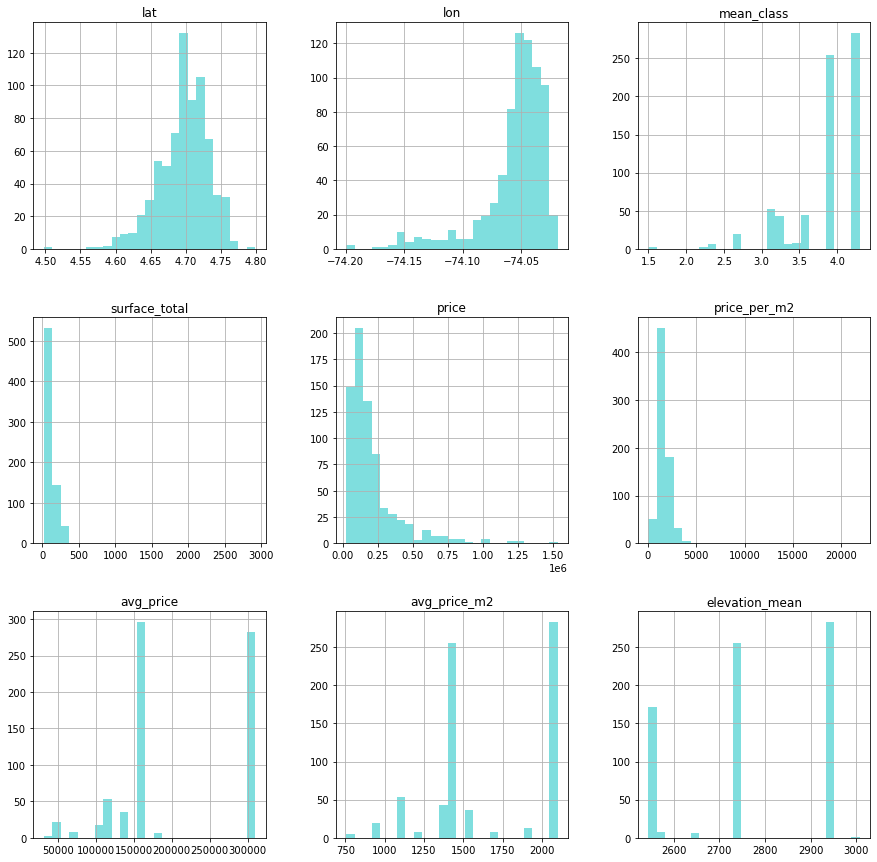

In [15]:
hist_df = df_USD.hist(bins=25, layout=(3,3), figsize=(15,15), color='c', alpha=0.5)

* IQR Filter

+++++++ iqr filter for surface_total +++++++ 

Column: surface_total, Median:94.5, 25%:67.0, 75%:142.25, IQR:-39.5:379.0
Number of rows dropped: 6

 +++++++ iqr filter for price per m2 +++++++ 

Column: price_per_m2, Median:1544.125, 25%:1256.05, 75%:1922.9325, IQR:-967.97:5389.99
Number of rows dropped: 2

 +++++++ iqr filter for price +++++++ 

Column: price, Median:145333.525, 25%:91104.6, 75%:228846.07749999998, IQR:-36875.68:603025.68
Number of rows dropped: 32


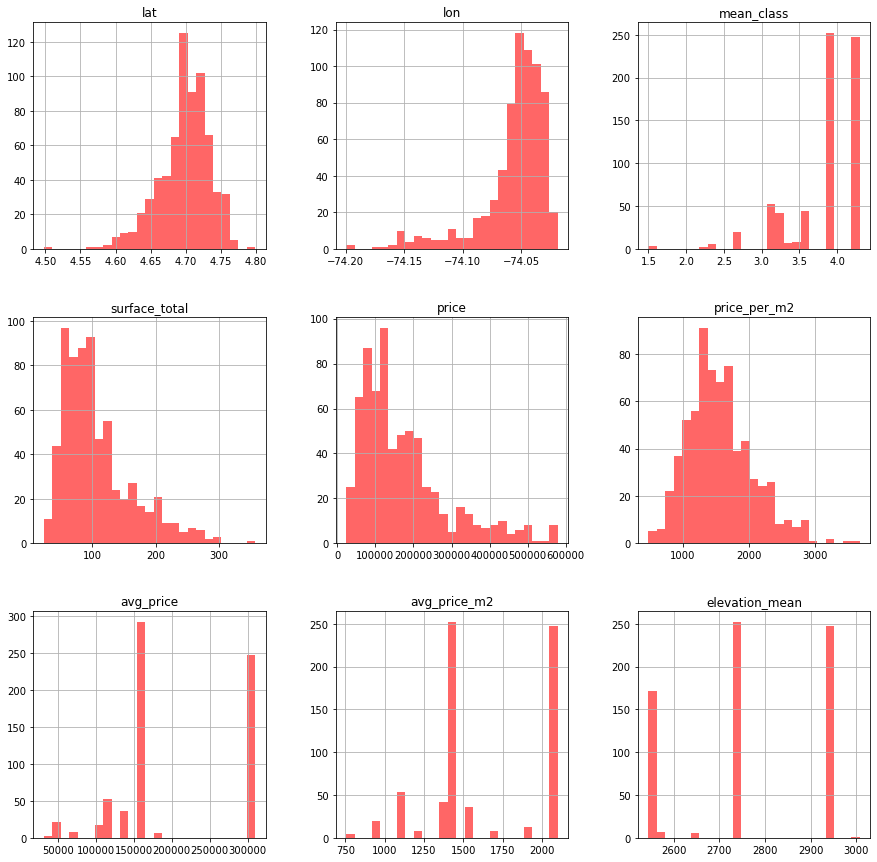

In [16]:
print('+++++++ iqr filter for surface_total +++++++ \n')
df_USD_iqr = iqr_filter(df_USD, 'surface_total', df_USD)
print('\n +++++++ iqr filter for price per m2 +++++++ \n')
df_USD_iqr = iqr_filter(df_USD_iqr, 'price_per_m2', df_USD_iqr)
print('\n +++++++ iqr filter for price +++++++ \n')
df_USD_iqr = iqr_filter(df_USD_iqr, 'price',df_USD_iqr)

hist_df_iqr = df_USD_iqr.hist(bins=25, layout=(3,3), figsize=(15,15), color='r', alpha=0.6)

### Map and data

- Street map of Bogotá + data in df_USD

In [11]:
mapa_bogota = pd.DataFrame.spatial.from_xy(df_USD, 'lon','lat')

In [12]:
street_bgta = gis.map('Bogotá, COL', zoomlevel=10)
street_bgta.basemap = 'streets'
street_bgta

MapView(layout=Layout(height='400px', width='100%'))

In [13]:
mapa_bogota.spatial.plot(map_widget=street_bgta)

True


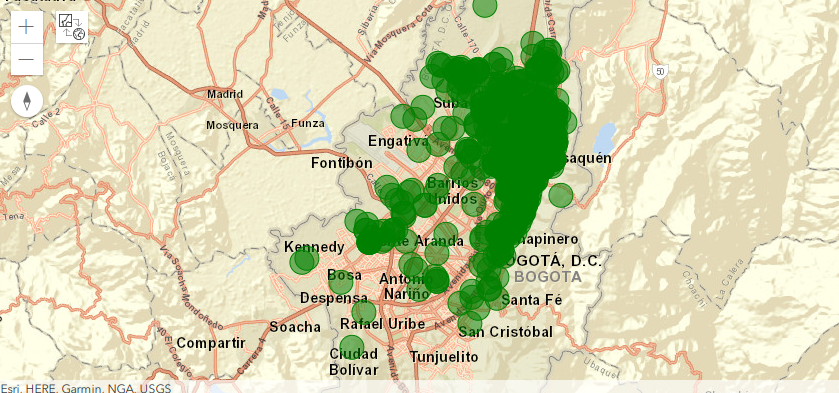

In [20]:
map_to_view('maps/street_bgta.png')

- Spatial density of properties in a given sector

In [22]:
heatmap_bgta = gis.map('Bogotá, COL')
heatmap_bgta.basemap = 'gray'
heatmap_bgta

MapView(layout=Layout(height='400px', width='100%'))

In [23]:
mapa_bogota.spatial.plot(map_widget=heatmap_bgta, renderer_type='h')

True


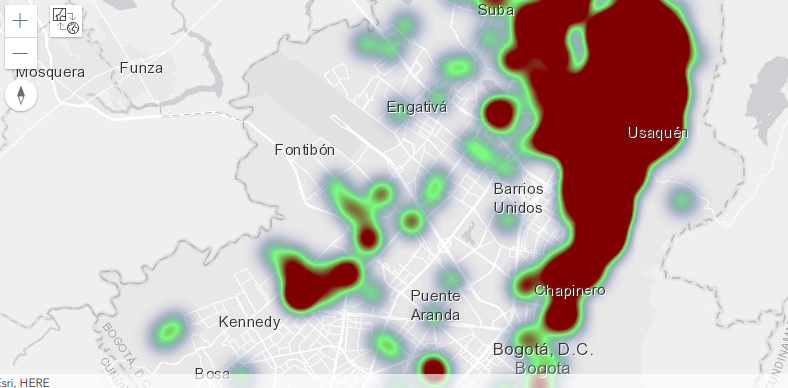

In [82]:
map_to_view('maps/heatmap_bgta.png')

##### Geographic distribution of properties 

- How much drop the prices between given loc?

In [24]:
sketch_bgta = gis.map("Bogotá, COL", zoomlevel=10)
sketch_bgta.basemap = 'gray-vector'
sketch_bgta

MapView(layout=Layout(height='400px', width='100%'))

In [25]:
mapa_bogota.spatial.plot(map_widget = sketch_bgta, renderer_type='c',
                         method='esriClassifyNaturalBreaks',  
                         class_count= 14, # 14 bogotá loc with data
                         col='price',
                         cmap='BuPu_r',  
                         alpha=0.2,
                         outline_color=[0,0,0,0])

True


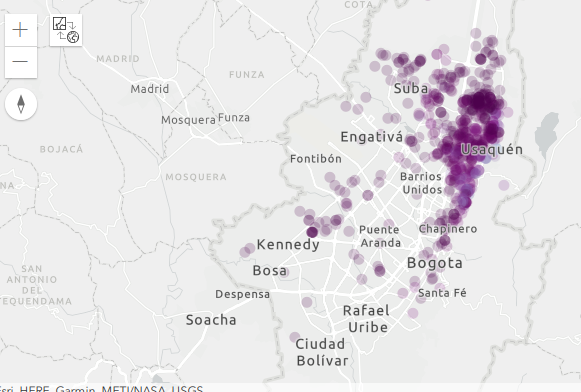

In [81]:
map_to_view('maps/pricemap_bgta.png')

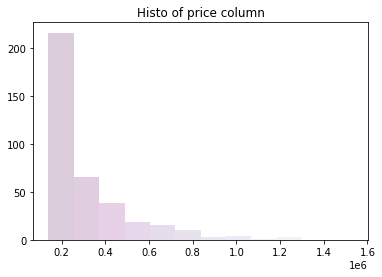

In [26]:
histo_map(sketch_bgta, mapa_bogota, 'price')

- How is elevation above sea level (AMSL) spacially distributed?

In [27]:
sketch_amsl_bgta = gis.map("Bogotá, COL", zoomlevel=10)
sketch_amsl_bgta.basemap = 'gray-vector'
sketch_amsl_bgta

MapView(layout=Layout(height='400px', width='100%'))

In [28]:
mapa_bogota.spatial.plot(map_widget = sketch_amsl_bgta, renderer_type='c',
                         method='esriClassifyNaturalBreaks',  
                         class_count= 14, # 14 bogotá loc with data
                         col='elevation_mean',
                         cmap='RdBu',  
                         alpha=0.8,
                         outline_color=[0,0,0,0])

True


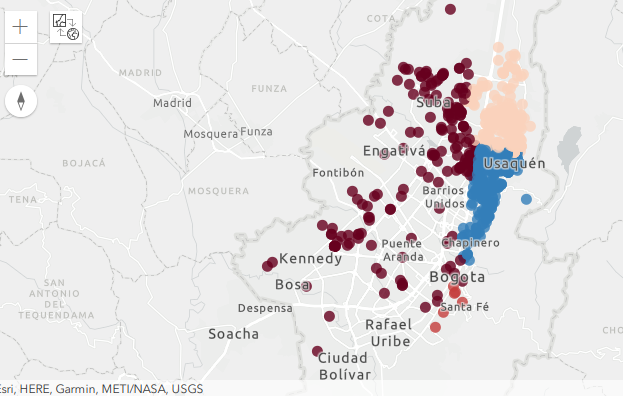

In [80]:
map_to_view('maps/amslmap_bgta.png')

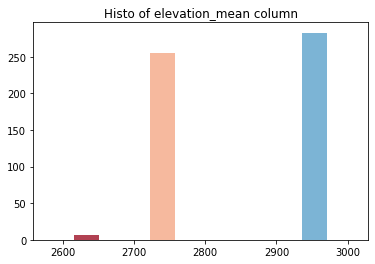

In [29]:
histo_map(sketch_amsl_bgta, mapa_bogota, 'elevation_mean')

- How's property size distributed?

In [30]:
sketch_surface_bgta = gis.map("Bogotá, COL", zoomlevel=10)
sketch_surface_bgta.basemap = 'gray-vector'
sketch_surface_bgta

MapView(layout=Layout(height='400px', width='100%'))

In [31]:
mapa_bogota.spatial.plot(map_widget = sketch_surface_bgta, renderer_type='c',
                         method='esriClassifyNaturalBreaks',  
                         class_count= 14, # 14 bogotá loc with data
                         col='surface_total',
                         cmap='RdBu',  
                         alpha=0.2,
                         outline_color=[0,0,0,0])

True


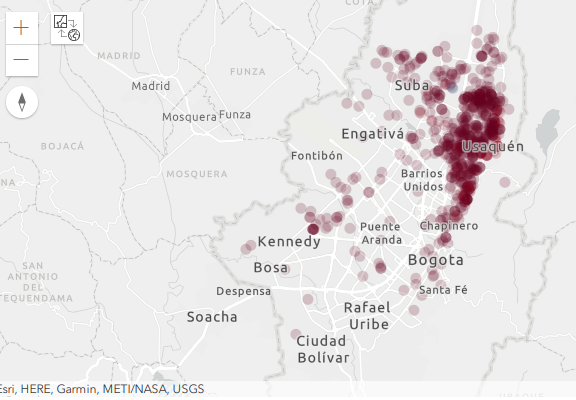

In [79]:
map_to_view('maps/surfacemap_bgta.png')

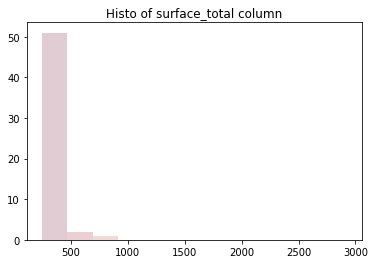

In [32]:
histo_map(sketch_surface_bgta, mapa_bogota, 'surface_total')

In [33]:
df_USD.loc[df_USD['surface_total'].idxmax()]

lat                                                        4.732939
lon                                                      -74.057781
location                                                    USAQUÉN
mean_class                                                 3.900000
surface_total                                           2921.000000
price                                                 173532.570000
price_per_m2                                              59.410000
currency                                                        USD
avg_price                                             155844.590000
avg_price_m2                                            1436.970000
elevation_mean                                          2730.080000
SHAPE             {'spatialReference': {'wkid': 4326}, 'x': -74....
Name: 686, dtype: object

### Correlation Matrix

In [34]:
import seaborn as sns 
from scipy.stats import norm 

<AxesSubplot:>

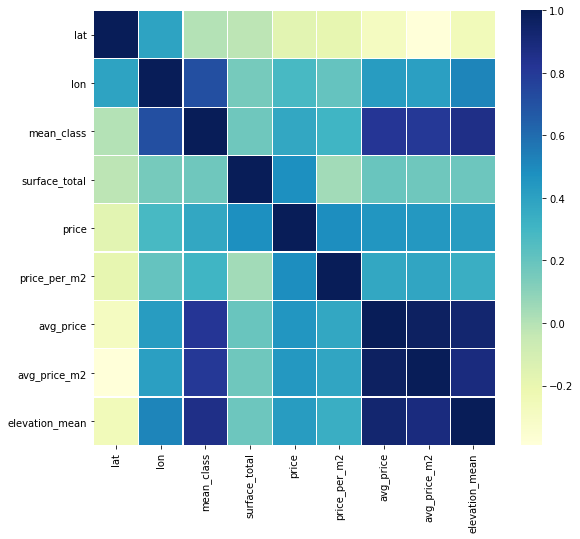

In [35]:
correlation_matrix = df_USD.corr()
f, ax = plt.subplots(figsize =(9, 8)) 
sns.heatmap(correlation_matrix, ax = ax, cmap ="YlGnBu", linewidths = 0.1) 

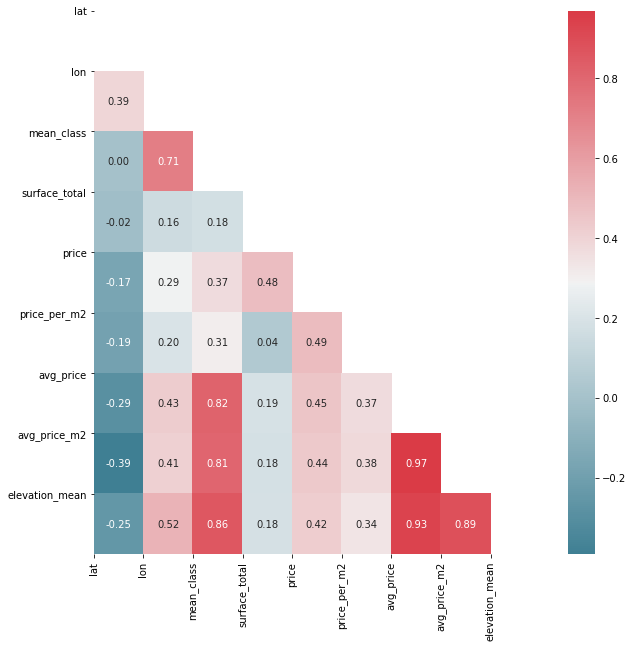

In [48]:
#colormap = sns.diverging_palette(220, 10, as_cmap=True)
#correlation_matrix.style.background_gradient(cmap=colormap).set_precision(2)
corr_map(df_USD, False)

In [119]:
df_USD['mean_class'].corr(df_USD['elevation_mean'])

0.8598129493896873

In [55]:
df_USD['elevation_mean'].corr(df_USD['avg_price_m2'])

0.8873687123691827

## (op) Feature scaling

aka normalization

In [58]:
from sklearn.preprocessing import MinMaxScaler
mm_scaler = MinMaxScaler()

df_to_scale = df_USD.drop(columns=['lat', 'lon', 'SHAPE'])

col_to_scale = ['mean_class', 'surface_total', 'price', 'price_per_m2', 'avg_price', 'avg_price_m2', 'elevation_mean']
scaled_array = mm_scaler.fit_transform(df_to_scale[col_to_scale])

df_scaled = pd.DataFrame(scaled_array, columns=col_to_scale)
df_scaled.head()

,mean_class,surface_total,price,price_per_m2,avg_price,avg_price_m2,elevation_mean
0,0.035714,0.008627,0.009598,0.033129,0.044226,0.028918,0.000000
1,0.750000,0.017943,0.055574,0.062578,0.399452,0.571741,0.014769
2,0.857143,0.020359,0.070899,0.069917,0.445789,0.507877,0.400912
3,0.857143,0.022774,0.078370,0.070004,0.445789,0.507877,0.400912
4,0.857143,0.110421,0.501925,0.101471,0.445789,0.507877,0.400912


### Histos

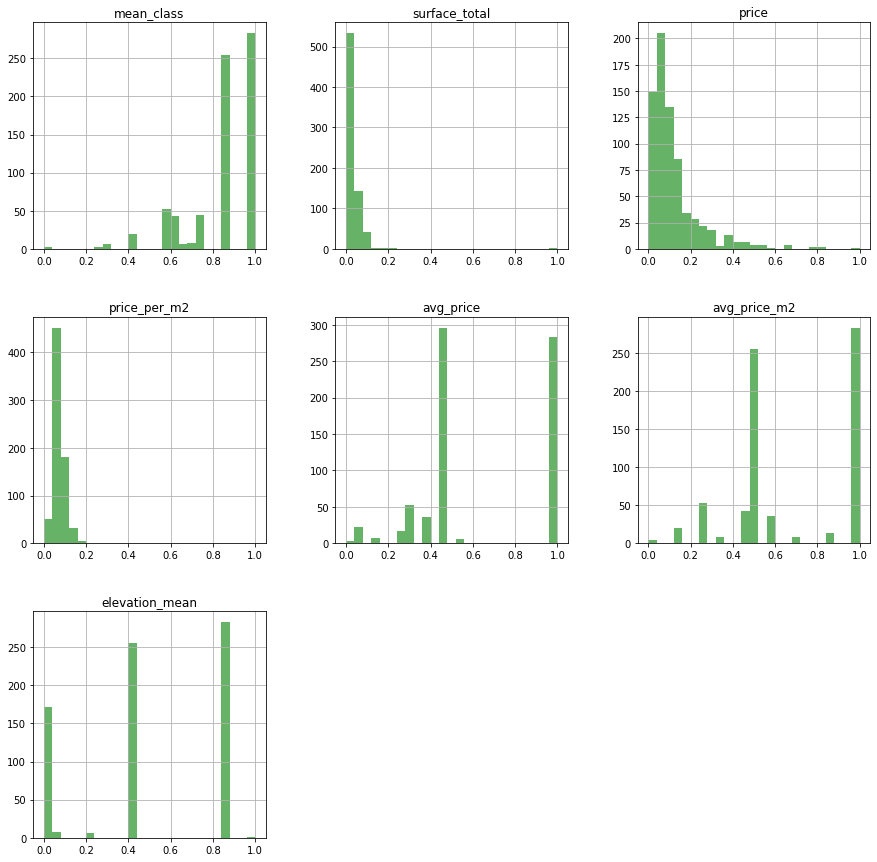

In [67]:
histos_scaled = df_scaled.hist(bins=25, layout=(3,3), figsize=(15,15), color='g', alpha=0.6)

+++++++ iqr filter for surface_total +++++++ 

Column: surface_total, Median:0.024672187715665976, 25%:0.01518288474810214, 75%:0.04114906832298137, IQR:-0.01:0.11
Number of rows dropped: 10

 +++++++ iqr filter for price per m2 +++++++ 

Column: price_per_m2, Median:0.06759698635365359, 25%:0.05470425746421146, 75%:0.08496897434336768, IQR:-0.04:0.24
Number of rows dropped: 2

 +++++++ iqr filter for price +++++++ 

Column: price, Median:0.08047738482378829, 25%:0.044893779569059045, 75%:0.1342359838265399, IQR:-0.01:0.35
Number of rows dropped: 36


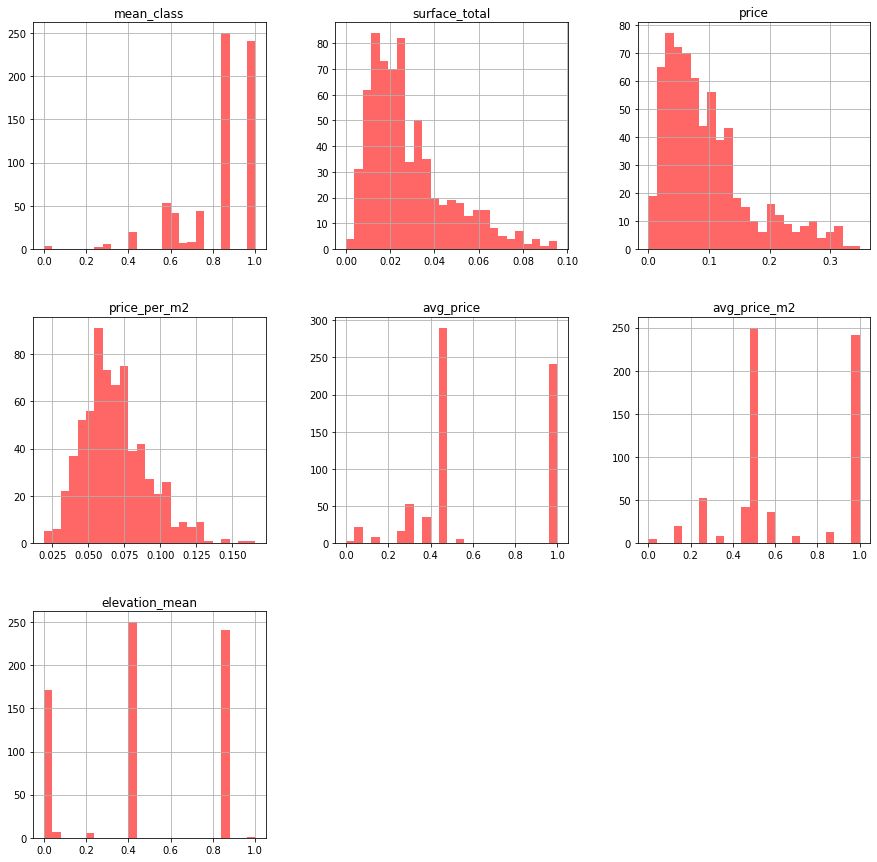

In [68]:
print('+++++++ iqr filter for surface_total +++++++ \n')
df_scaled_iqr = iqr_filter(df_scaled, 'surface_total', df_scaled)
print('\n +++++++ iqr filter for price per m2 +++++++ \n')
df_scaled_iqr = iqr_filter(df_scaled_iqr, 'price_per_m2', df_scaled_iqr)
print('\n +++++++ iqr filter for price +++++++ \n')
df_scaled_iqr = iqr_filter(df_scaled_iqr, 'price',df_scaled_iqr)

hist_scaled_iqr = df_scaled_iqr.hist(bins=25, layout=(3,3), figsize=(15,15), color='r', alpha=0.6)

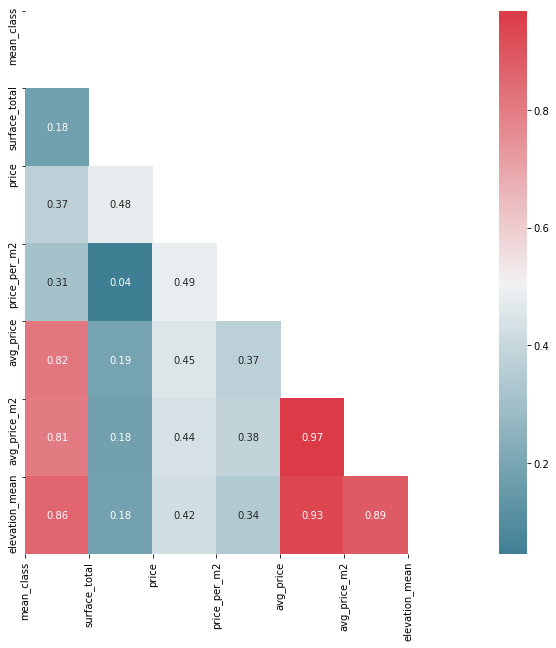

In [71]:
corr_map(df_scaled, False)

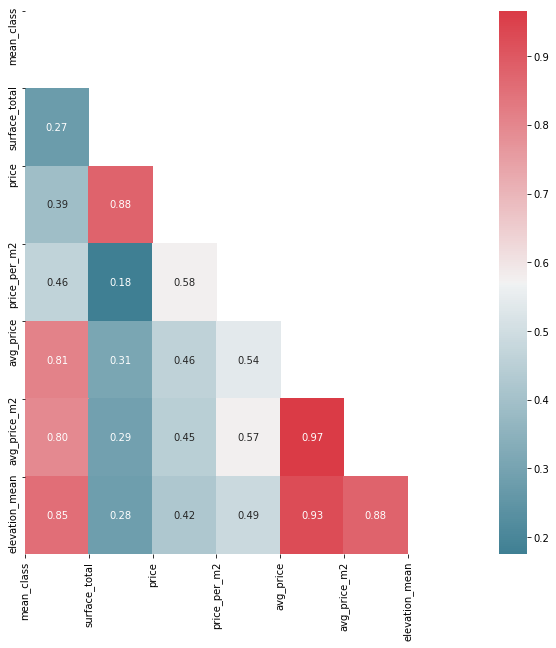

In [72]:
corr_map(df_scaled_iqr, False)

# Some Highlights/Insights

From the correlation matrix, some insights are:

- It is seemed to be a linear correlation between the elevation above sea level and the average price per square meter as well as between the mean class (estrato) of a given sector in Bogotá.

- The elevation above sea level is not linearly correlated to surface of a give flat in the city. This doesn't necessarly mean that it follows a non-linear correlation, a detailed study should be carried out to seek for any correlation.

- IQR filter and feature scaling doesn't affect much the outcome, though it is seemed to provide a better linear correlation (since it filters data).

From the histograms and geographic (spatially) distributions, some insights are:

- The geographic distribution for the elevation above sea level shows that the properties with highest altitude in the `company A DB` are located in USAQUÉN and CHAPINERO. 
 
- The top 5 locations offered by Company with the more expensive properties according to the price per square meter are located in CHAPINERO, LOS MÁRTIRES, LA CANDELARIA, TEUSAQUILLO and USAQUÉN

- USAQUÉN is the sector with more properties offered by Company. On the other hand, KENNEDY and BOSA are the sector with lesser properties offered. (To clarify, there are sectors in Bogotá such as ANTONIO NARIÑO, RAFAEL URIBE SANTA FE, SAN CRISTOBAL, CIUDAD BOLÍVAR that don't count with properties offered by Company. A plausible reason for that could be that didn't pass the filters.

- The sector with the property with the highest surface area is located in USAQUEN with an area of 2921 $m^2$ evaluated in $173.533 usd$, approx.

**What stories can be told from the data?**

* Company A in Bogotá: Which are the sectors that Company A are investing in?

* How are distributed the properties around Bogotá?

* Top 5 Company A' locations with the highest altitude above sea level (AMSL) in Bogotá

* Does the altitude matters, when it comes to buy a property in Bogotá? Let's find out if there is any relation between elevation above sea level and flats.

* ¿Qué influencia tiene la altitud en el precio de propiedades en Bogotá?

* Usaquén: La localidad en Bogotá con mayor oferta de propiedades

**Useful resources**


[1. Arcgis Python](https://medium.com/geoai/house-hunting-the-data-scientist-way-b32d93f5a42f)

[2. Correlation Matrix](https://ajh1143.github.io/Corr/)